# Vizualization jupyter for create all plots
- heat map:
    * single heatmap
    * all subsets inone plot
    * heatmap for base subset but with different split and scaffolds
    * hetmap showing comparison between base and other subsets
    * heatmap showing values difference between baseline and other subsets
- radar plots
- trends plot
- t-SNE
- overlaps


In [2]:
from scipy.spatial import distance
from sklearn import manifold
from sklearn import decomposition
from sklearn import preprocessing
from sklearn.decomposition import PCA
from sklearn.metrics import jaccard_score
from matplotlib.colors import ListedColormap

import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from rdkit import Chem
from rdkit.Chem import Draw

#from scripts import visualization
import importlib as imp

# Import knihoven
import pandas as pd
import numpy as np
from rdkit import Chem
from rdkit.Chem import AllChem
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
import time
#imp.reload(visualization)

In [219]:
from src import heatmap_visualization as hv
import importlib as imp
imp.reload(hv)

import pandas as pd

# HEATMAPS

### Heatmap of single split

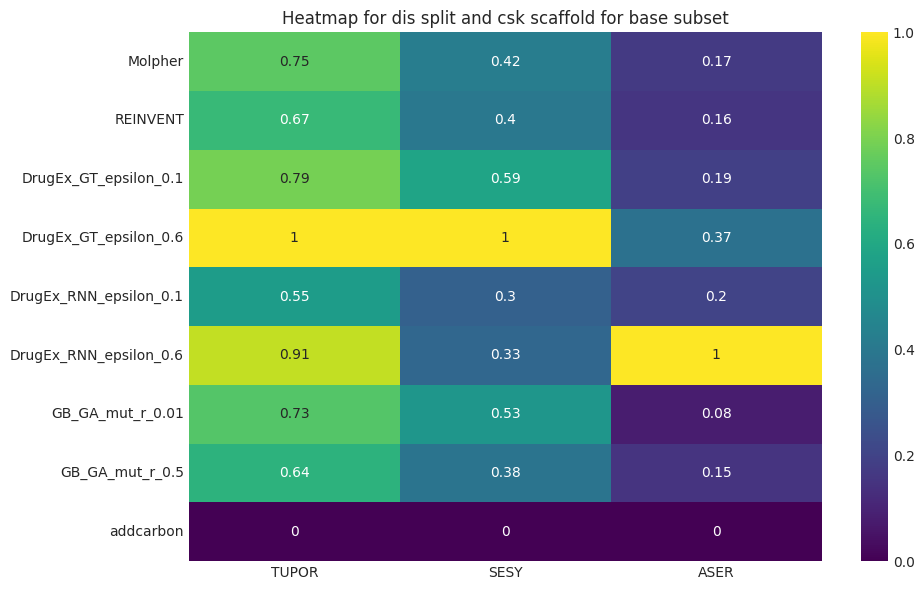

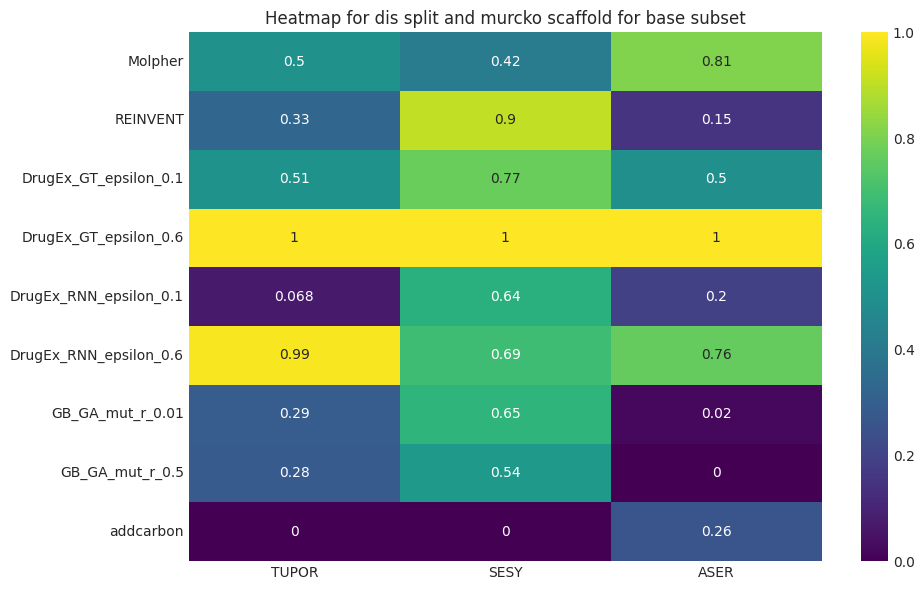

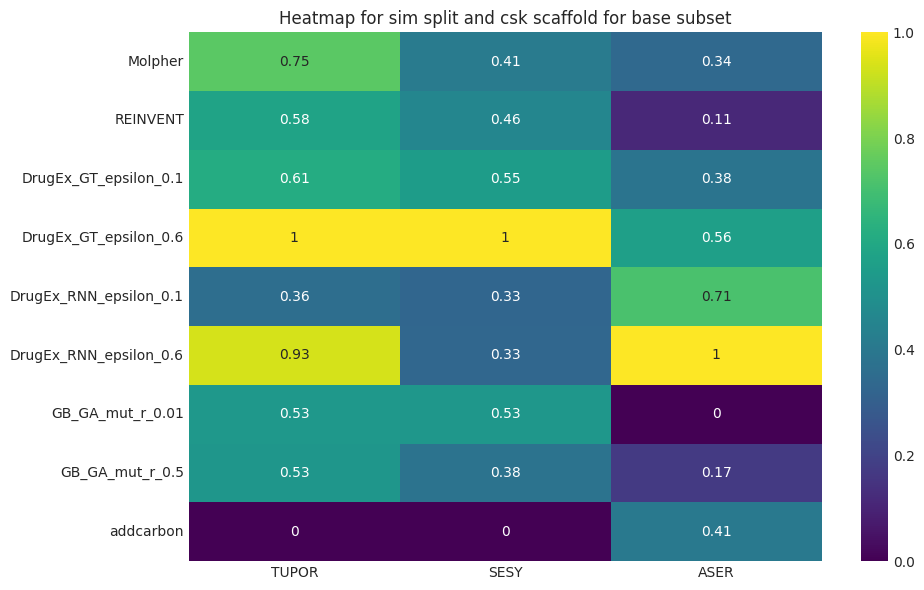

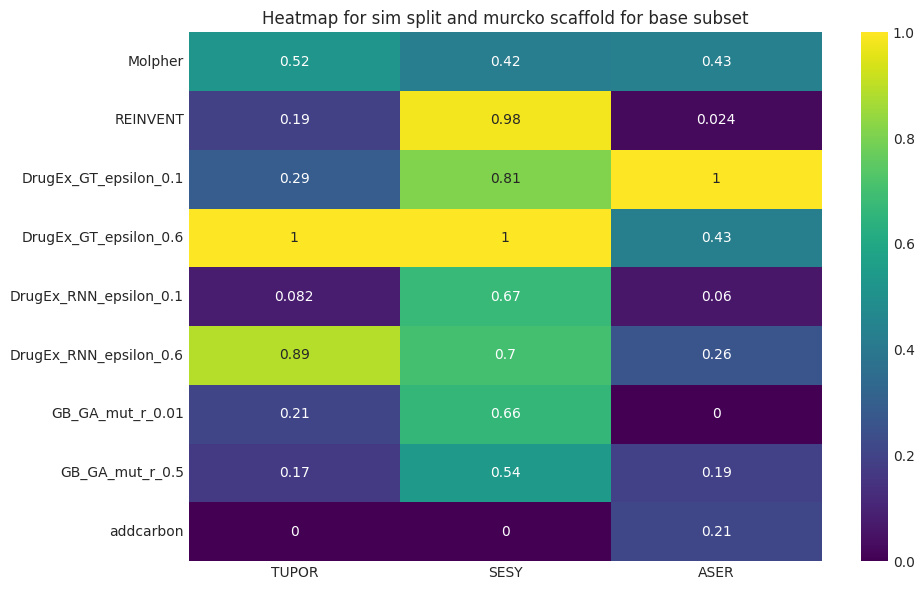

In [224]:
# Iterate over different types of splits (e.g., 'dis' and 'sim')
for type_cluster in ['dis', 'sim']:
    # Iterate over different scaffold types (e.g., 'csk' and 'murcko')
    for type_scaffold in ['csk', 'murcko']:
        # Iterate over the subsets (in this case, an empty subset to represent the base) (e.g. '_10k', '_100k', '_500k', '')
        for subset in ['', '_10k', '_100k', '_500k']:
            #Define which generator you want to visualize
            generators_name_list = [
                f"Molpher{subset}",
                f"REINVENT{subset}",
                f"DrugEx_GT_epsilon_0.1{subset}",
                f"DrugEx_GT_epsilon_0.6{subset}",
                f"DrugEx_RNN_epsilon_0.1{subset}",
                f"DrugEx_RNN_epsilon_0.6{subset}",
                f"GB_GA_mut_r_0.01{subset}",
                f"GB_GA_mut_r_0.5{subset}",
                f"addcarbon{subset}"
            ]
            receptor = 'Glucocorticoid_receptor'
            
            df = hv.preprocesing(type_cluster, type_scaffold, generators_name_list, receptor)
            # If the subset is empty, label it as 'base' (representing the baseline subset)
            if subset == '':
                subset = 'base'

                # Call the plot_heatmap function to generate and display the heatmap for the loaded data
                # The title dynamically reflects the split type, scaffold, and subset name
                name_save = f'heatmap_{type_cluster}_{type_scaffold}{subset}'
                hv.plot_heatmap(df, title=f"Heatmap for {type_cluster} split and {type_scaffold} scaffold for {subset} subset", name_save=name_save, receptor = receptor)


### Heatmap of different subsets visualized in a single plot.

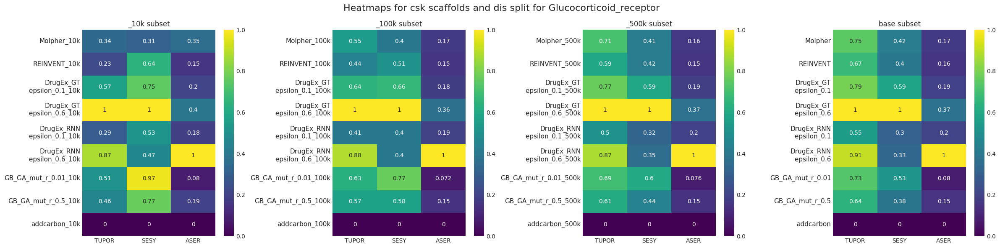

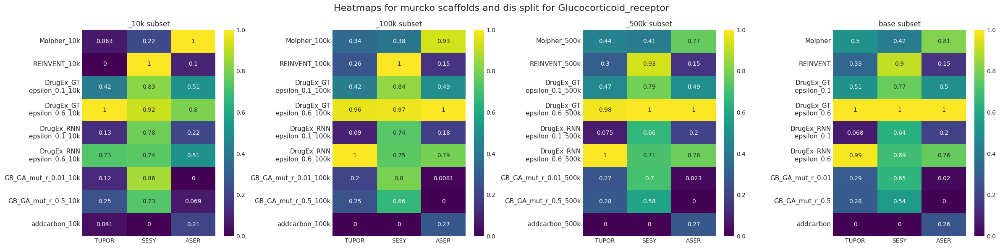

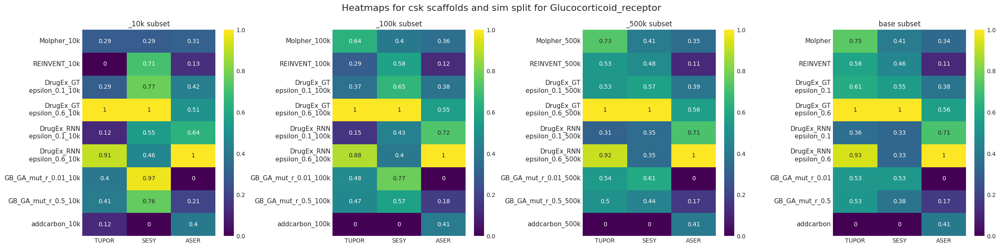

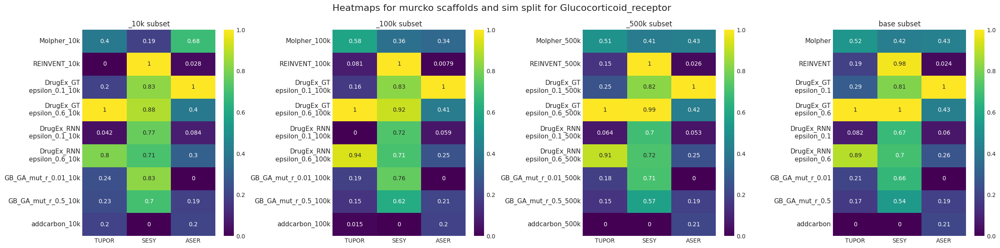

In [222]:
# Iterate through different types of splits (e.g., 'dis' and 'sim') and scaffold types (e.g., 'csk' and 'murcko')
for type_cluster in ['dis', 'sim']:
    for type_scaffold in ['csk', 'murcko']:
        # Initialize an empty dictionary to store the data for each subset
        subset_dict = {}

        # Iterate through different subsets (base, 1k, 10k, 100k, 500k)
        for k, subset in enumerate(['_10k', '_100k', '_500k', '']):
            receptor = 'Glucocorticoid_receptor'
            # Load the corresponding DataFrame from the CSV file based on the subset
            
            generators_name_list = [
                f"Molpher{subset}",
                f"REINVENT{subset}",
                f"DrugEx_GT_epsilon_0.1{subset}",
                f"DrugEx_GT_epsilon_0.6{subset}",
                f"DrugEx_RNN_epsilon_0.1{subset}",
                f"DrugEx_RNN_epsilon_0.6{subset}",
                f"GB_GA_mut_r_0.01{subset}",
                f"GB_GA_mut_r_0.5{subset}",
                f"addcarbon{subset}"
            ]
            
            df = hv.preprocesing(type_cluster, type_scaffold, generators_name_list, receptor)
            
            # Add the loaded data to the subset_dict with the subset name as the key
            subset_dict[subset] = df
        
        # Call the plot_all_subsets function to plot heatmaps for all subsets in the subset_dict
        name_save = f'5x1_heat_maps_{type_cluster}_{type_scaffold}_{receptor}'
        # The title for the heatmap figure is dynamically generated based on the scaffold type and split type
        hv.plot_all_subsets(subset_dict, title=f'Heatmaps for {type_scaffold} scaffolds and {type_cluster} split for {receptor}', receptor = receptor, name_save=name_save)


### Plotting Heatmaps for Compared to Baseline Data for Different Split Types and Scaffold Combinations


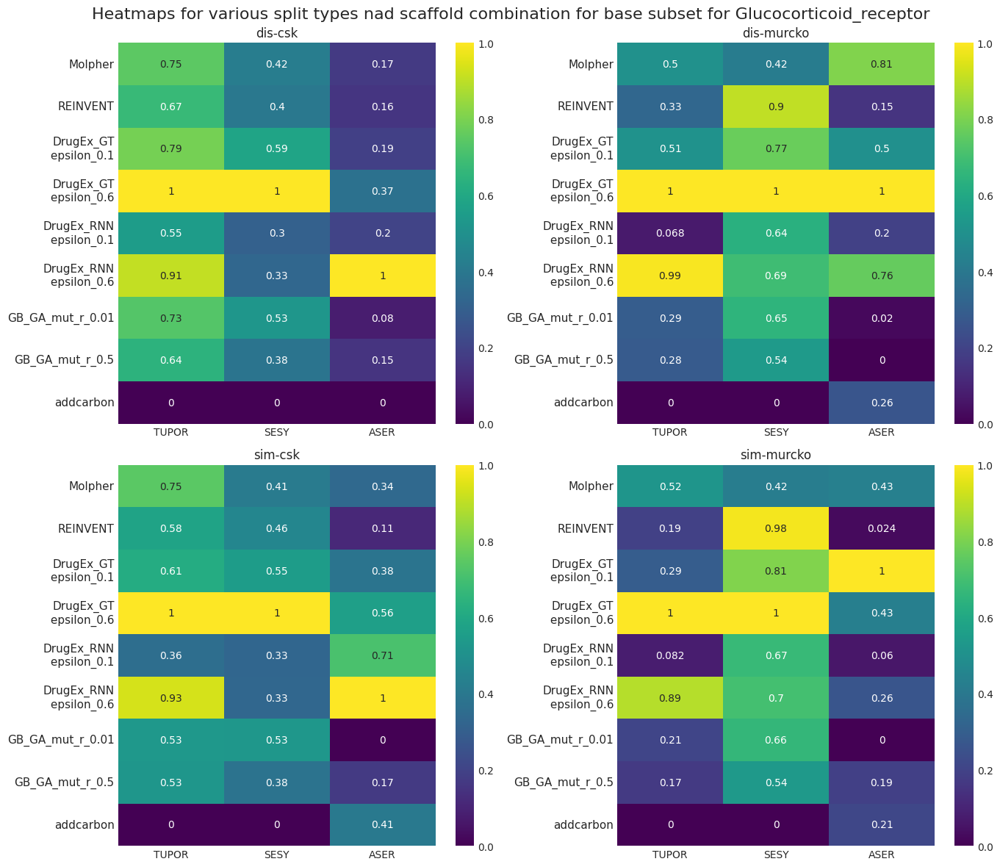

In [223]:
# Initialize empty dictionaries to store data and titles for each subset
subset_dict = {}
subset_dict_data = {}

# Iterate over the different types of splits ('dis', 'sim') and scaffold types ('csk', 'murcko')
for i, type_cluster in enumerate(['dis', 'sim']):
    for j, type_scaffold in enumerate(['csk', 'murcko']):
        receptor = 'Glucocorticoid_receptor'
        # Load the DataFrame for the 'base' subset from the corresponding CSV file
        # The file path is constructed dynamically based on the type_split and scaf
        generators_name_list = [
                f"Molpher",
                f"REINVENT",
                f"DrugEx_GT_epsilon_0.1",
                f"DrugEx_GT_epsilon_0.6",
                f"DrugEx_RNN_epsilon_0.1",
                f"DrugEx_RNN_epsilon_0.6",
                f"GB_GA_mut_r_0.01",
                f"GB_GA_mut_r_0.5",
                f"addcarbon"
            ]
            
        df = hv.preprocesing(type_cluster, type_scaffold, generators_name_list, receptor)
        
        # Store the loaded DataFrame in the subset_dict with a key representing its position in the grid (i,j)
        subset_dict[f'{i},{j}'] = df
        
        # Store a descriptive title for the subset in subset_dict_data (e.g., 'dis-csk', 'sim-murcko')
        subset_dict_data[f'{i},{j}'] = f'{type_cluster}-{type_scaffold}'

name_save = 'heat_map_comparison_base_all_splits'
# Call the plot_heatmap_base function to plot the heatmaps for all subsets in the subset_dict
# The title 'Heatmaps' will be displayed for the overall figure
hv.plot_heatmap_base(subset_dict, subset_dict_data, title = f'Heatmaps for various split types nad scaffold combination for base subset for {receptor}', receptor = receptor, name_save = name_save)


### Visualization of Heatmaps for Differences Between Baseline and Other Subsets

/home/filv/.conda/envs/drugex/lib/python3.10/site-packages/seaborn/matrix.py:202: RuntimeWarning: All-NaN slice encountered
  vmin = np.nanmin(calc_data)
/home/filv/.conda/envs/drugex/lib/python3.10/site-packages/seaborn/matrix.py:207: RuntimeWarning: All-NaN slice encountered
  vmax = np.nanmax(calc_data)


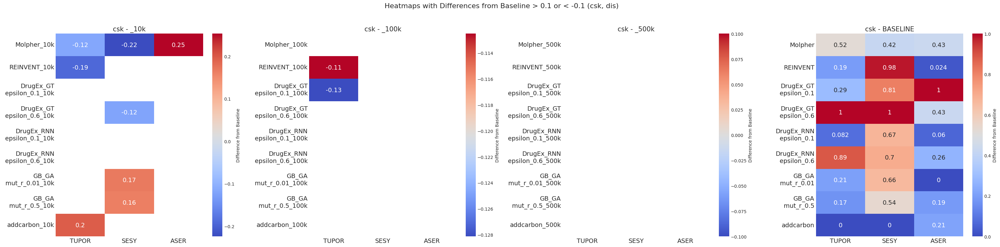

/home/filv/.conda/envs/drugex/lib/python3.10/site-packages/seaborn/matrix.py:202: RuntimeWarning: All-NaN slice encountered
  vmin = np.nanmin(calc_data)
/home/filv/.conda/envs/drugex/lib/python3.10/site-packages/seaborn/matrix.py:207: RuntimeWarning: All-NaN slice encountered
  vmax = np.nanmax(calc_data)


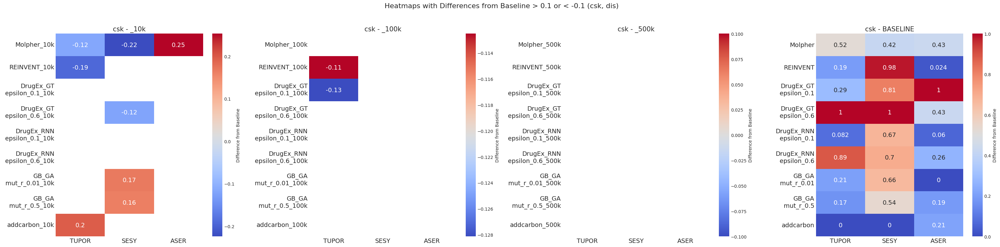

/home/filv/.conda/envs/drugex/lib/python3.10/site-packages/seaborn/matrix.py:202: RuntimeWarning: All-NaN slice encountered
  vmin = np.nanmin(calc_data)
/home/filv/.conda/envs/drugex/lib/python3.10/site-packages/seaborn/matrix.py:207: RuntimeWarning: All-NaN slice encountered
  vmax = np.nanmax(calc_data)


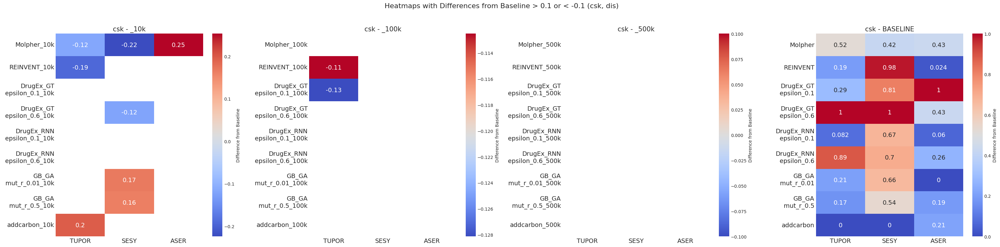

/home/filv/.conda/envs/drugex/lib/python3.10/site-packages/seaborn/matrix.py:202: RuntimeWarning: All-NaN slice encountered
  vmin = np.nanmin(calc_data)
/home/filv/.conda/envs/drugex/lib/python3.10/site-packages/seaborn/matrix.py:207: RuntimeWarning: All-NaN slice encountered
  vmax = np.nanmax(calc_data)


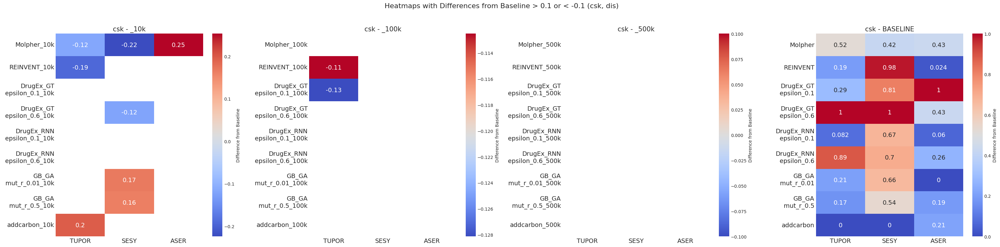

In [220]:
for type_split in ['dis', 'sim']:
    for scaf in ['csk', 'murcko']:
        receptor = 'Glucocorticoid_receptor'
        # Load the baseline data (replace with your actual file paths)
        for subset in ['_10k', '_100k', '_500k', '']:
            generators_name_list = [
                f"Molpher{subset}",
                f"REINVENT{subset}",
                f"DrugEx_GT_epsilon_0.1{subset}",
                f"DrugEx_GT_epsilon_0.6{subset}",
                f"DrugEx_RNN_epsilon_0.1{subset}",
                f"DrugEx_RNN_epsilon_0.6{subset}",
                f"GB_GA_mut_r_0.01{subset}",
                f"GB_GA_mut_r_0.5{subset}",
                f"addcarbon{subset}"
            ]
            
            df = hv.preprocesing(type_cluster, type_scaffold, generators_name_list, receptor)
            
            # Load the baseline data for the given split type and scaffold
            if subset == '': #baseline
                base_line = df
                
            data_dict[subset] = df
            
        name_save = f'5x1_heat_maps_{type_split}_{scaf}_{receptor}_diff'
        # Call the function to plot heatmaps
        hv.plot_heatmaps_with_diff_from_baseline(baseline_df, data_dict, type_split='dis', scaf='csk', receptor = receptor, name_save = name_save)


# RADAR PLOTS

In [241]:
from src import radar_plot as ra
import importlib as imp
imp.reload(ra)


<module 'src.radar_plot' from '/home/filv/phd_projects/iga_2023/git_reccal/new/recall_metrics/src/radar_plot.py'>

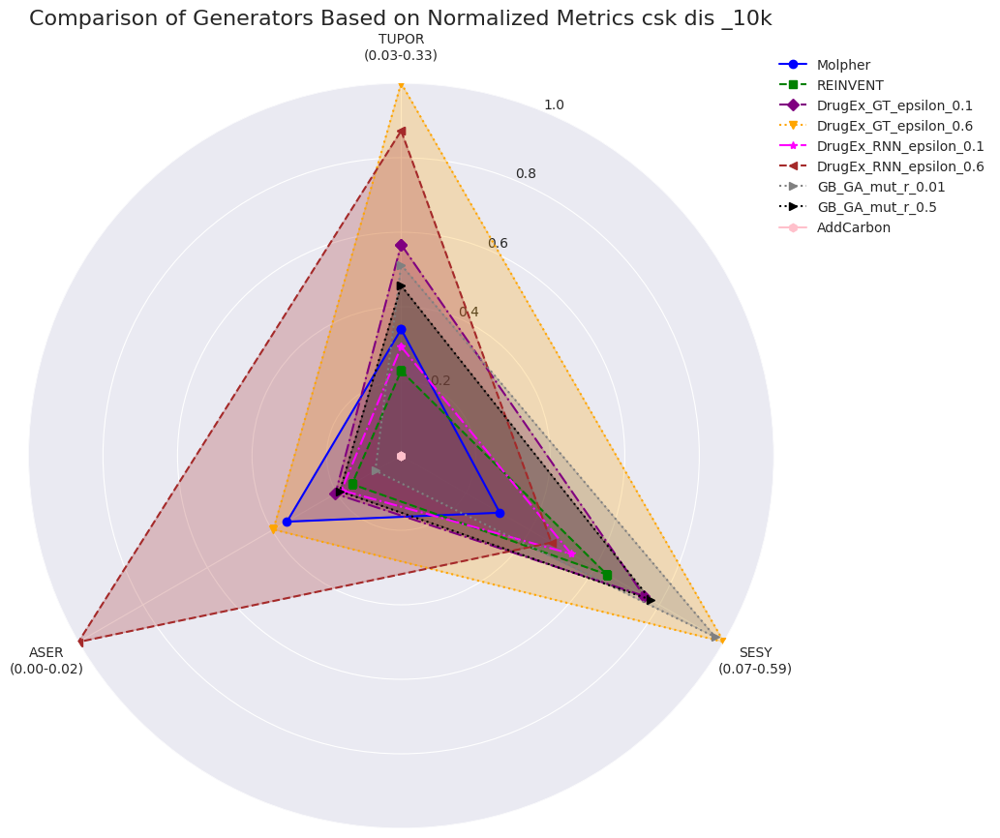

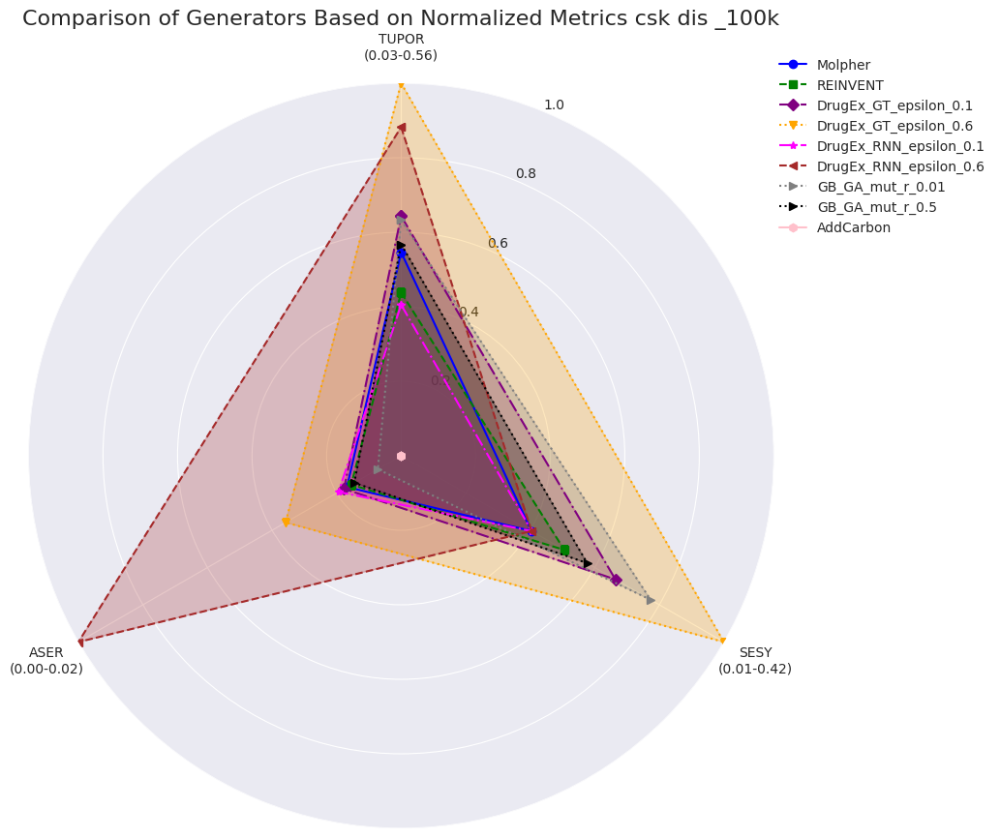

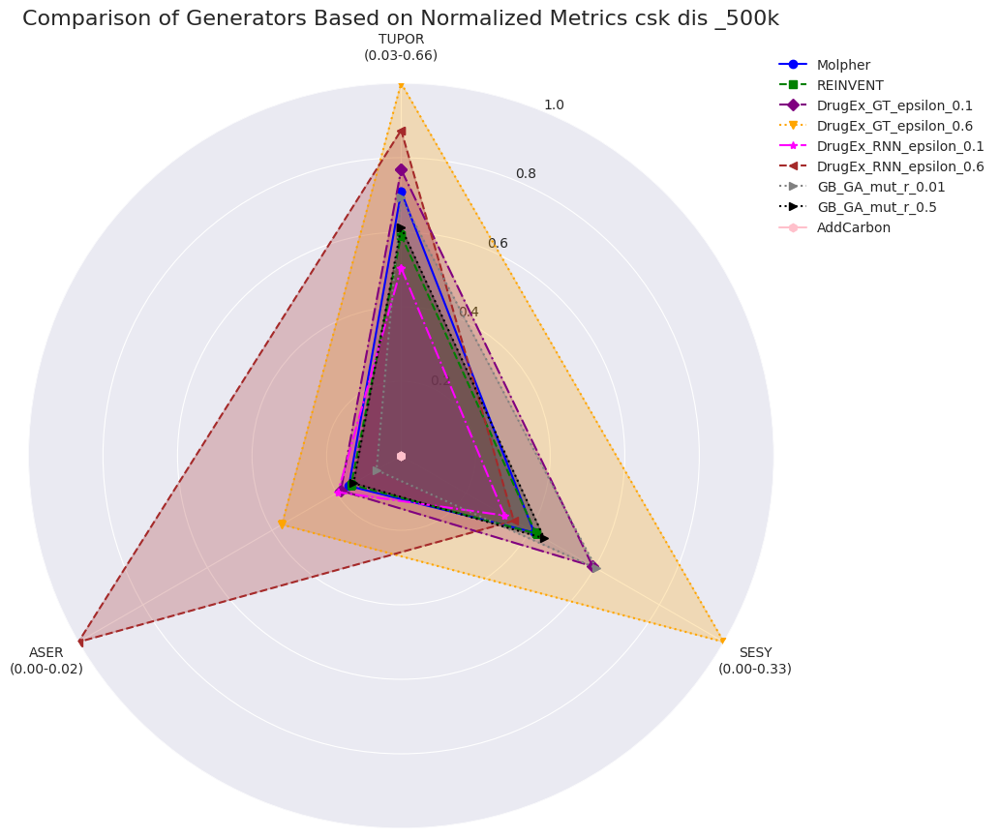

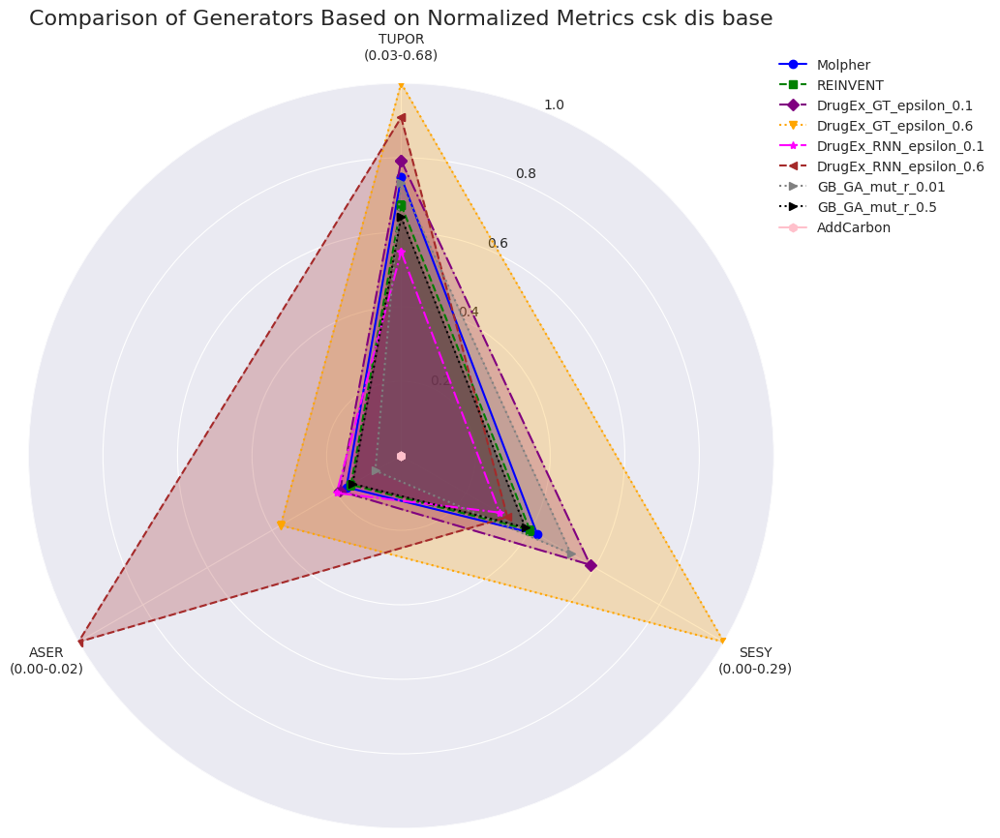

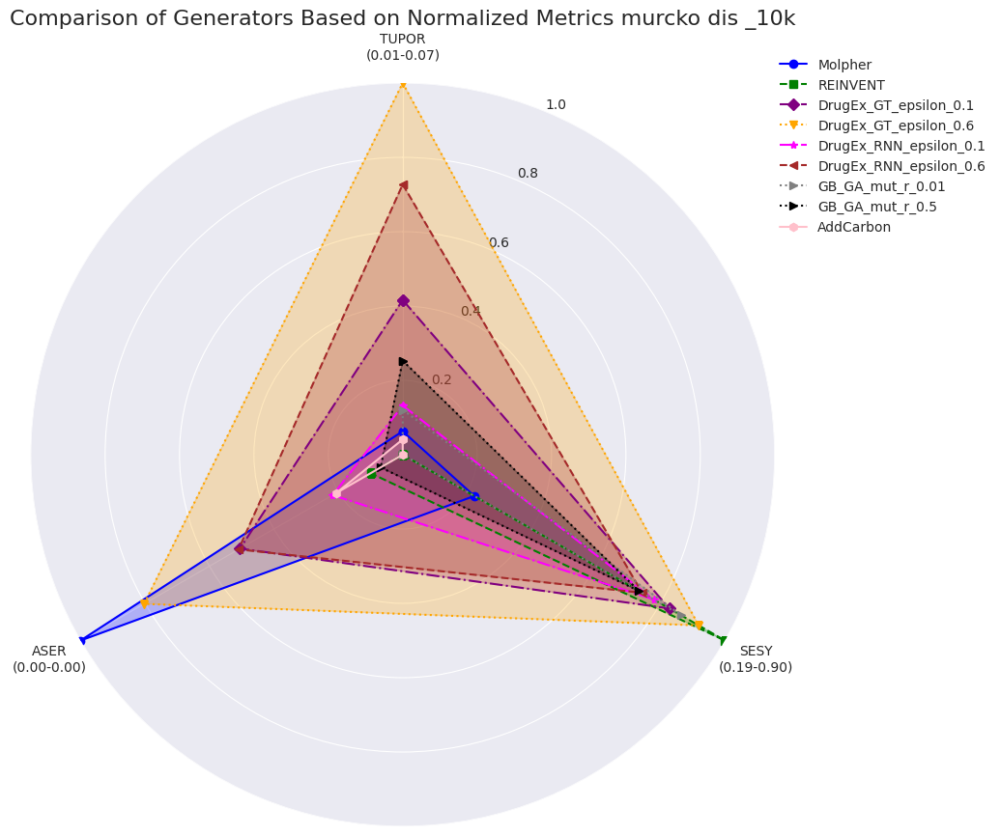

...

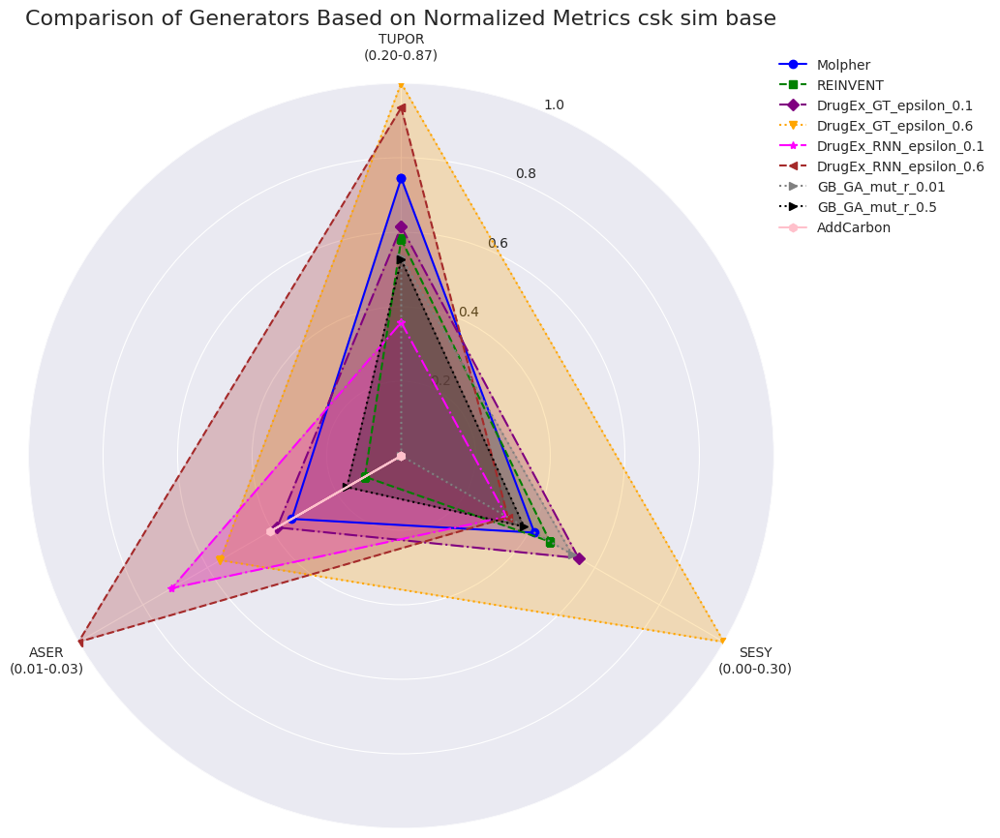

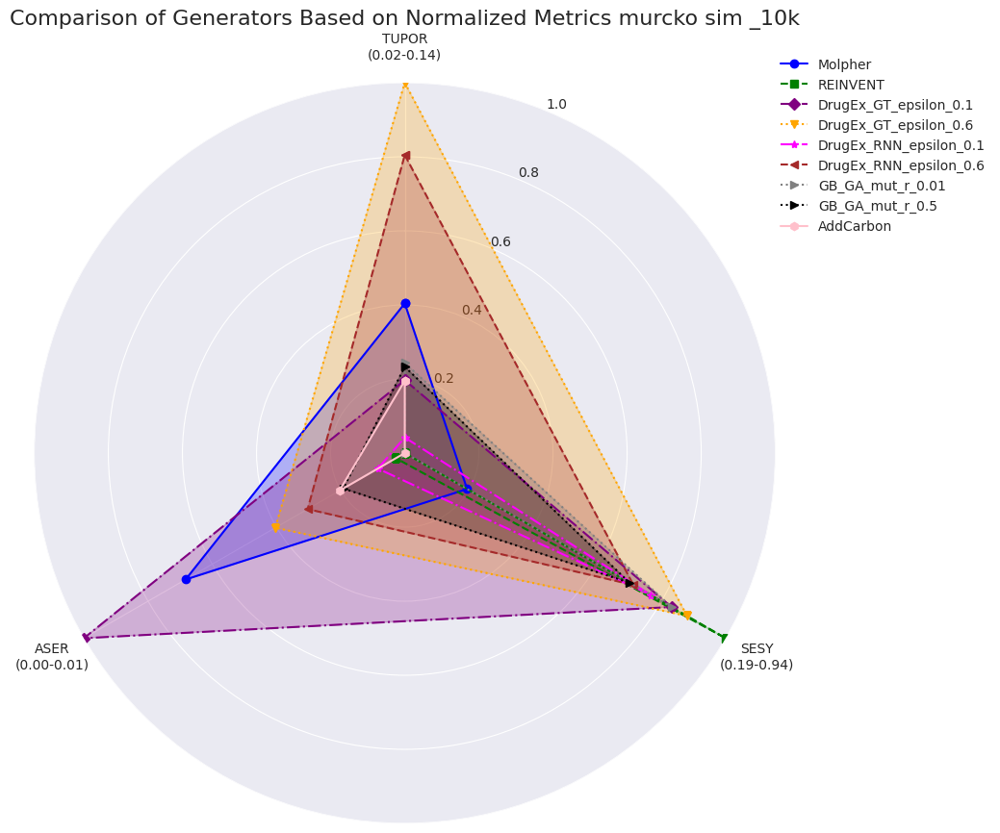

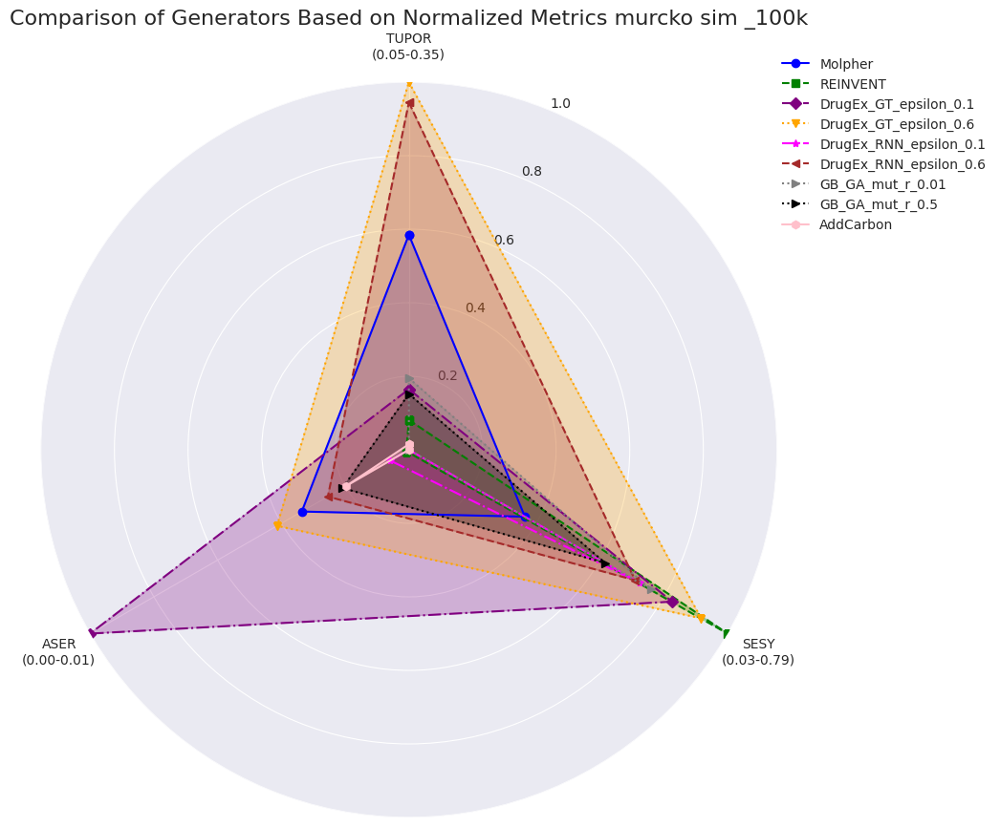

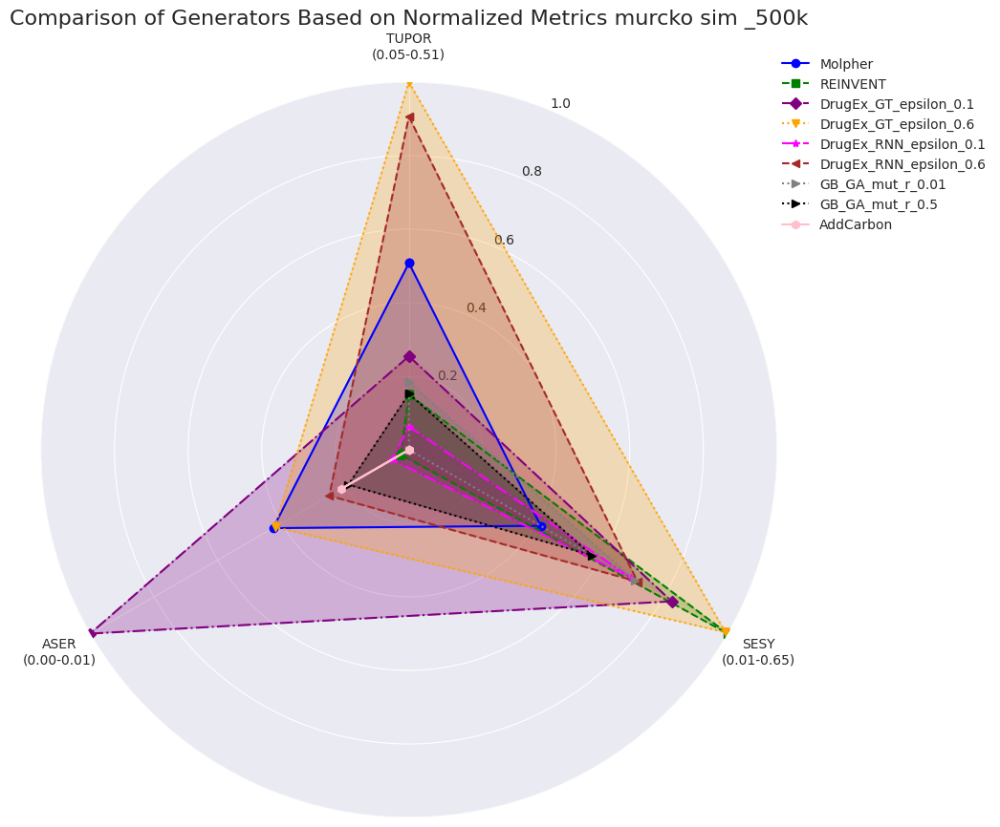

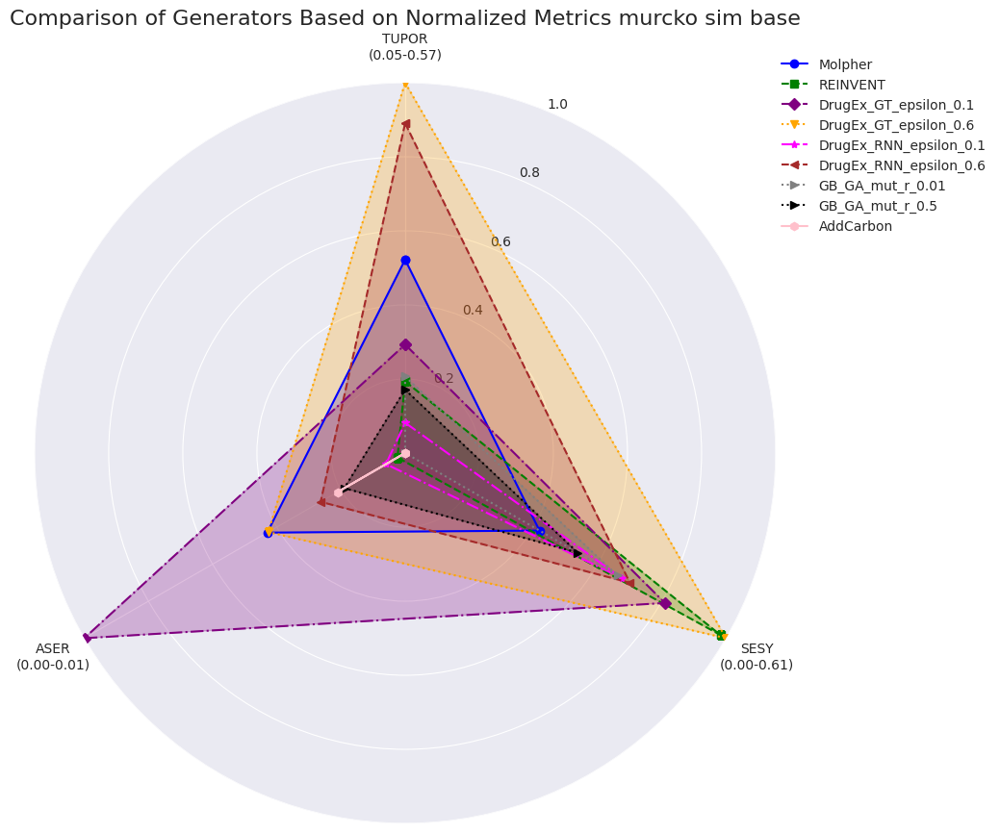

In [243]:
# Loop through different types of data splits ('dis' and 'sim')
for type_cluster in ['dis', 'sim']:
    # Loop through different scaffold types ('csk' and 'murcko')
    for type_scaffold in ['csk', 'murcko']:
        # Loop through different subset types (e.g., '_10k', '_100k', '_500k', and no subset)
        for subset in ['_10k', '_100k', '_500k', '']:
            receptor = 'Glucocorticoid_receptor'
            # Load the dataset based on the current scaffold, data split, and subset
            
            generators_name_list = [
                f"Molpher{subset}",
                f"REINVENT{subset}",
                f"DrugEx_GT_epsilon_0.1{subset}",
                f"DrugEx_GT_epsilon_0.6{subset}",
                f"DrugEx_RNN_epsilon_0.1{subset}",
                f"DrugEx_RNN_epsilon_0.6{subset}",
                f"GB_GA_mut_r_0.01{subset}",
                f"GB_GA_mut_r_0.5{subset}",
                f"addcarbon{subset}"
            ]
            
            df = ra.preprocesing(type_cluster, type_scaffold, generators_name_list, receptor)

            
            # Call the function to normalize the data and plot the radar charts
            # Pass the dataframe, data split type, scaffold type, and subset as arguments
            ra.normalize_and_plot_radar_charts(df, type_cluster, type_scaffold, subset, receptor)

# Trends plot

In [294]:
from src import trend_plot as tr
import importlib as imp
imp.reload(tr)


<module 'src.trend_plot' from '/home/filv/phd_projects/iga_2023/git_reccal/new/recall_metrics/src/trend_plot.py'>

### Vizualization for singal trends to each split, scaffold and subset

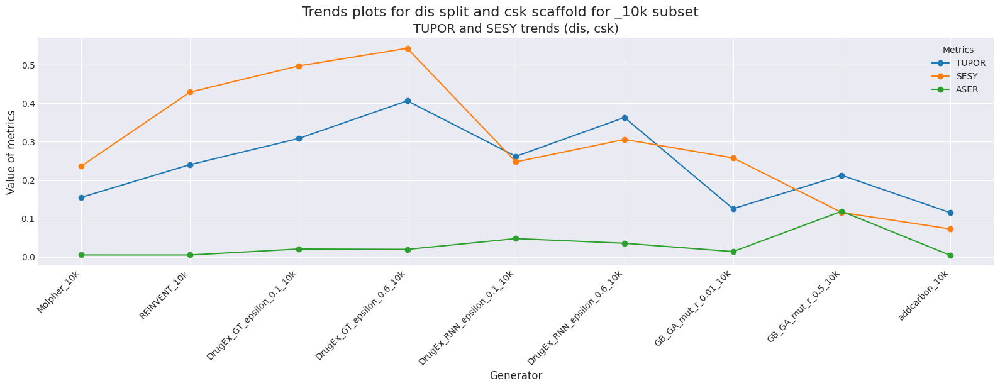

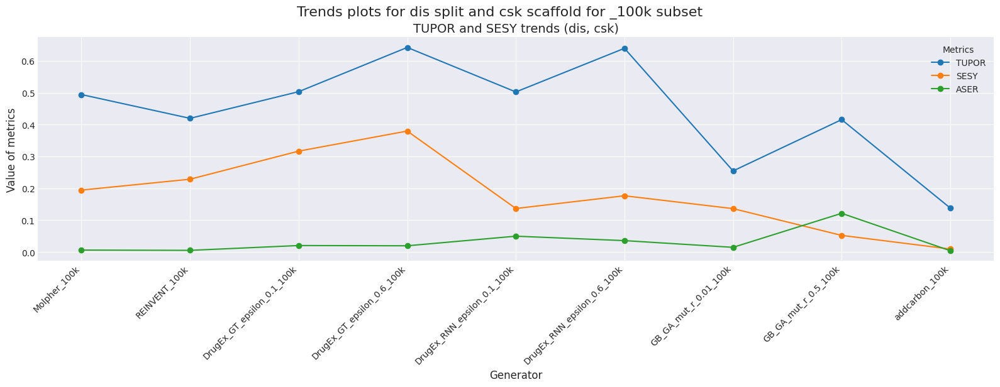

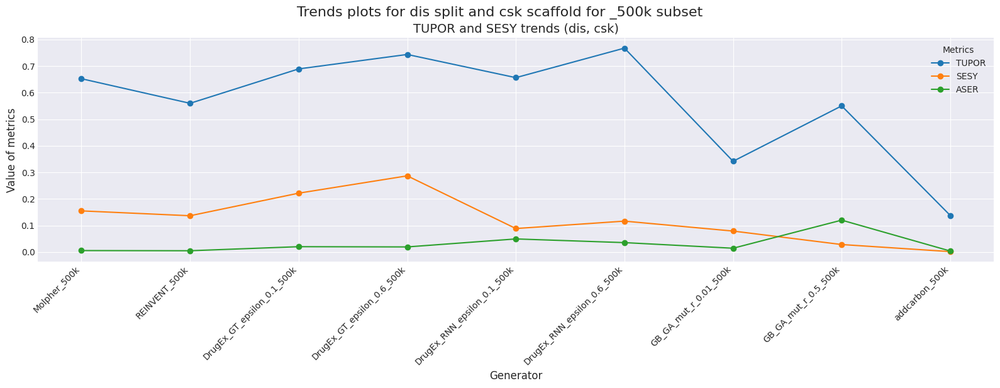

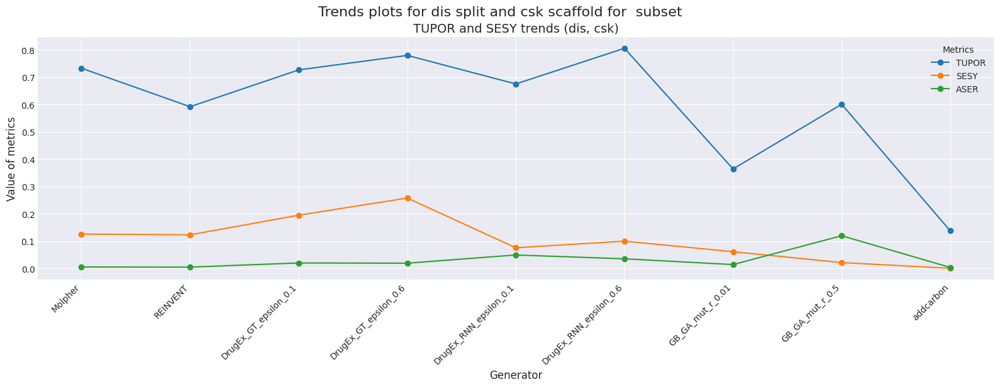

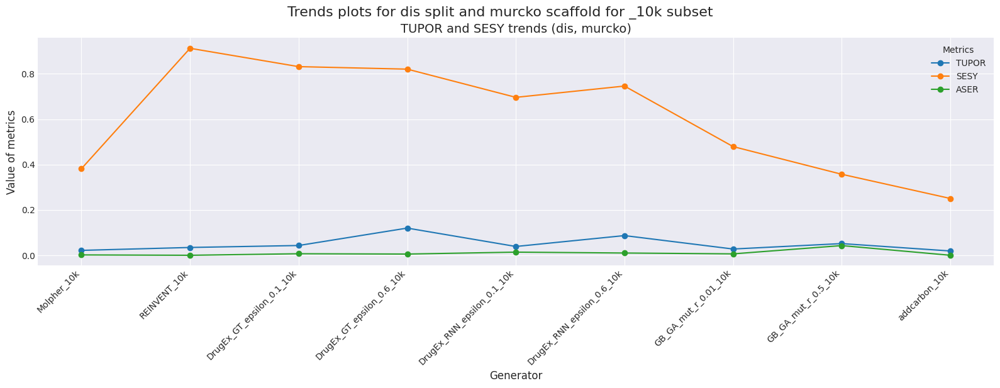

...

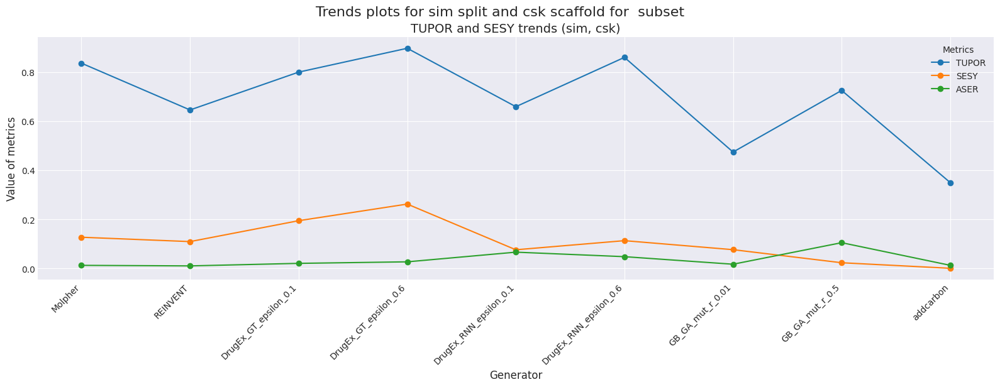

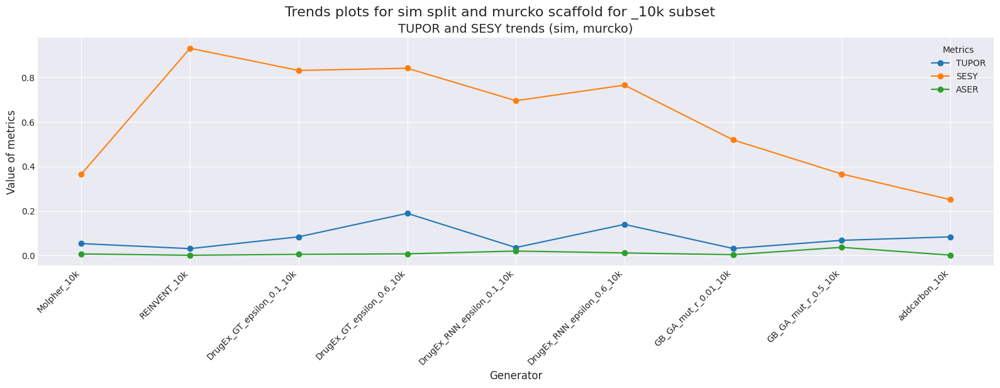

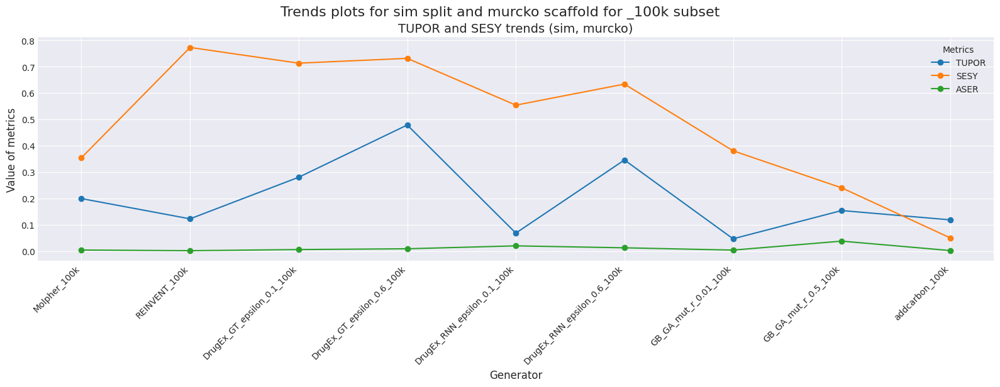

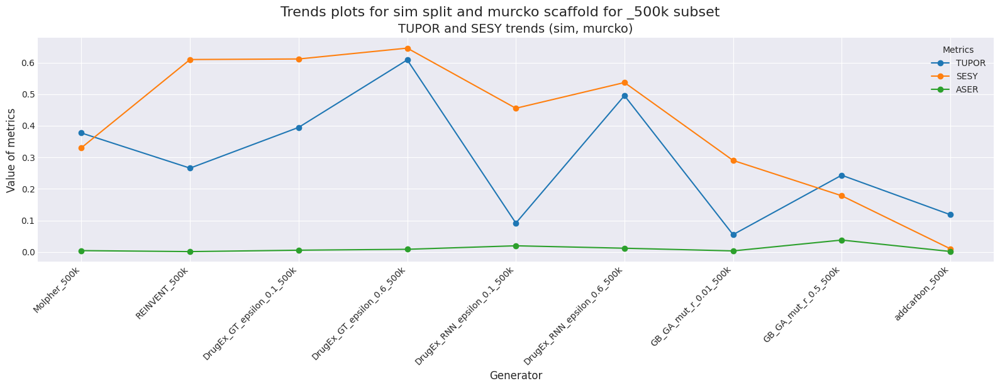

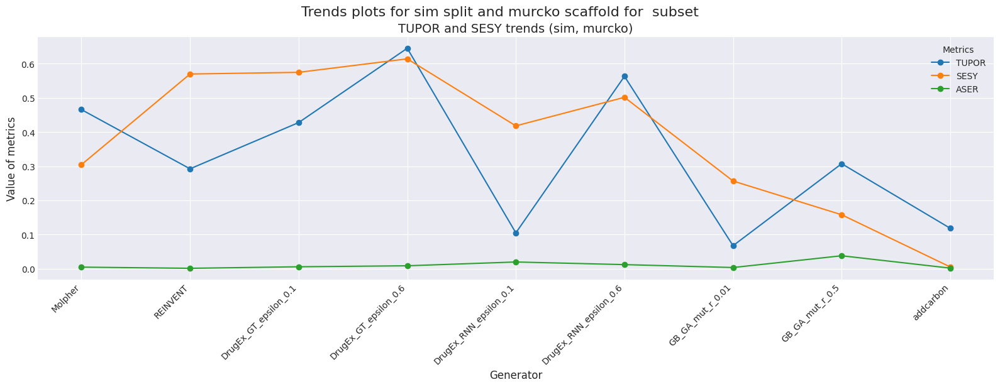

In [256]:
# Loop through different data splits ('dis' and 'sim')
for type_cluster in ['dis', 'sim']:
    # Loop through different scaffold types ('csk' and 'murcko')
    for type_scaffold in ['csk', 'murcko']:
        # Loop through different subsets (empty string, '_1k', '_10k', '_100k', '_500k')
        for subset in [ '_10k', '_100k', '_500k', '']:
            # Load the dataset
            receptor = 'Leukocyte_elastase'
            
            generators_name_list = [
                f"Molpher{subset}",
                f"REINVENT{subset}",
                f"DrugEx_GT_epsilon_0.1{subset}",
                f"DrugEx_GT_epsilon_0.6{subset}",
                f"DrugEx_RNN_epsilon_0.1{subset}",
                f"DrugEx_RNN_epsilon_0.6{subset}",
                f"GB_GA_mut_r_0.01{subset}",
                f"GB_GA_mut_r_0.5{subset}",
                f"addcarbon{subset}"
            ]
            
            df = tr.preprocesing(type_cluster, type_scaffold, generators_name_list, receptor)

            
            
            if receptor == 'Glucocorticoid_receptor':
                name_save = f'trend_plot_{type_cluster}_{type_scaffold}{subset}_GR'
            elif receptor == 'Leukocyte_elastase':
                name_save = f'trend_plot_{type_cluster}_{type_scaffold}{subset}_LE'
            tr.plot_trends(df, type_cluster, type_scaffold, subset, receptor = receptor, name_save = name_save)


### Vizualization comparison trends between different subset

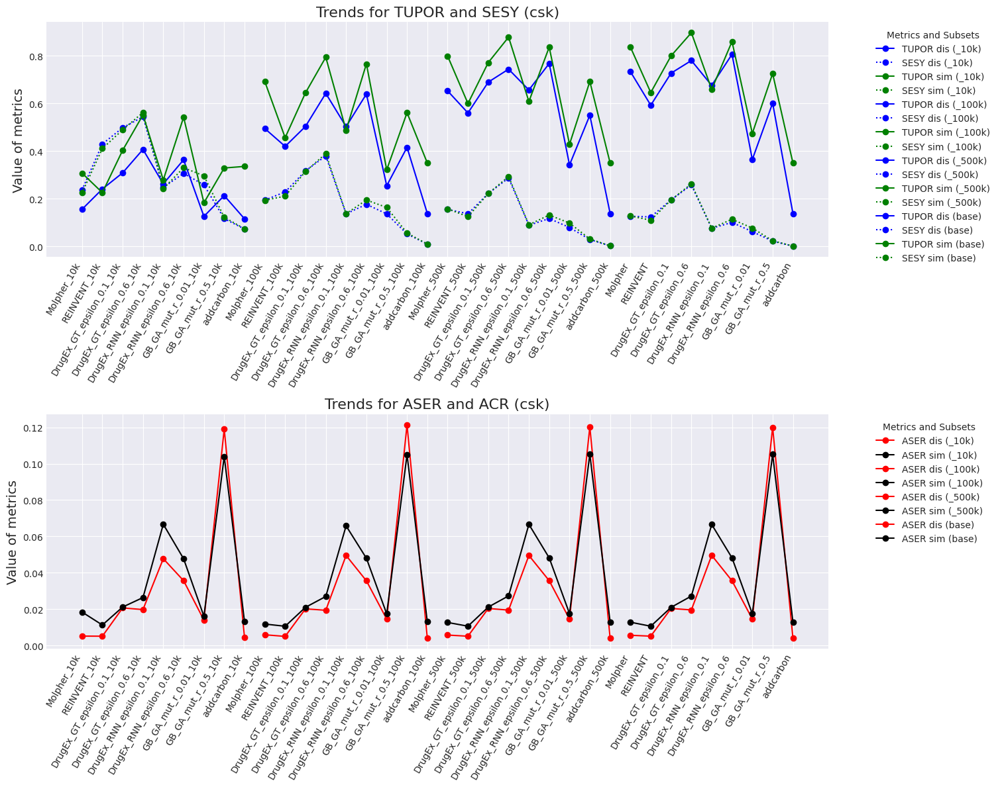

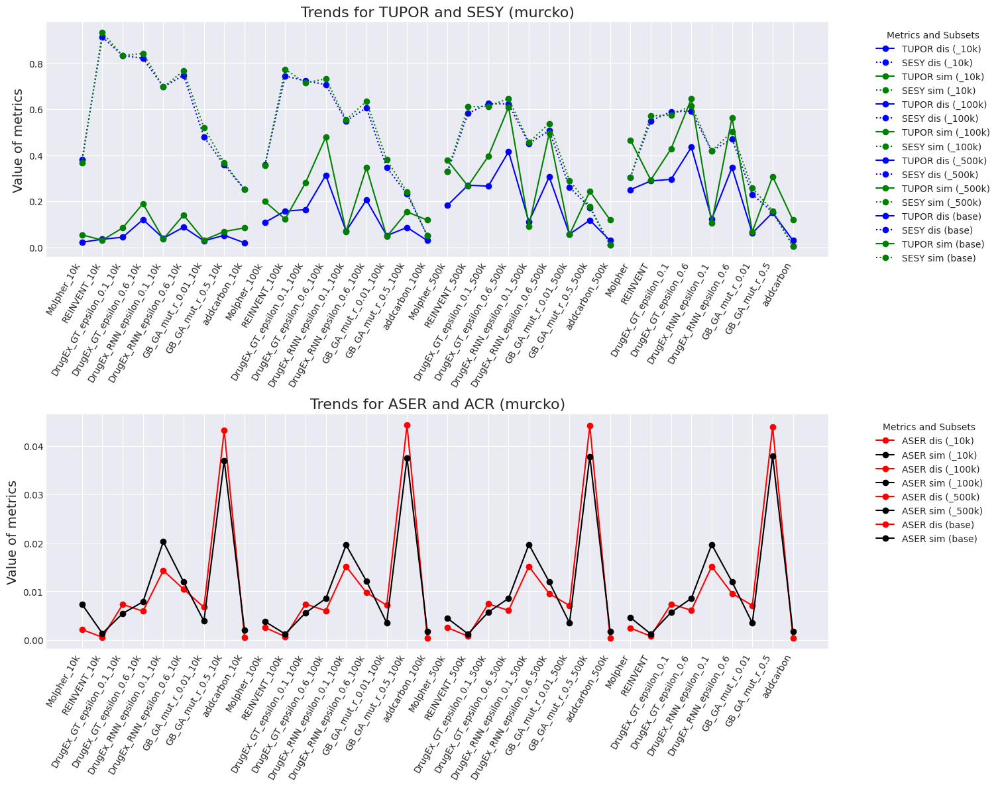

In [282]:
# Define scaffold type and subsets to use

for type_scaffold in ['csk', 'murcko']:
    subsets_list = ['_10k', '_100k', '_500k', '']  # Define the subsets you want to analyze
    
    df_all = pd.DataFrame()
    
    # Load and combine data for each subset and split type
    for type_cluster in ['dis', 'sim']:
        for subset in subsets_list:
            
            generators_name_list = [
                f"Molpher{subset}",
                f"REINVENT{subset}",
                f"DrugEx_GT_epsilon_0.1{subset}",
                f"DrugEx_GT_epsilon_0.6{subset}",
                f"DrugEx_RNN_epsilon_0.1{subset}",
                f"DrugEx_RNN_epsilon_0.6{subset}",
                f"GB_GA_mut_r_0.01{subset}",
                f"GB_GA_mut_r_0.5{subset}",
                f"addcarbon{subset}"
            ]
            
            df = tr.preprocesing(type_cluster, type_scaffold, generators_name_list, receptor)
            df = df[['name', 'TUPOR', 'SESY', 'ASER']]
            df['Subset'] = subset if subset else 'base'  # Rename empty subset as 'base'
            df['Split'] = type_cluster
            df_all = pd.concat([df_all, df], ignore_index=True)
                
    receptor = 'Leukocyte_elastase'
    if receptor == 'Glucocorticoid_receptor':
        name_save = f'1x4_trens_plot_{type_scaf}_GR'
    elif receptor == 'Leukocyte_elastase':
        name_save = f'1x4_trens_plot_{type_scaf}_LE'
    # Call the function
    tr.plot_subset_trends(type_scaffold, df_all, subsets_list, receptor, name_save)

### Vizualization of trends plot between all type of splits and type of scaffolds

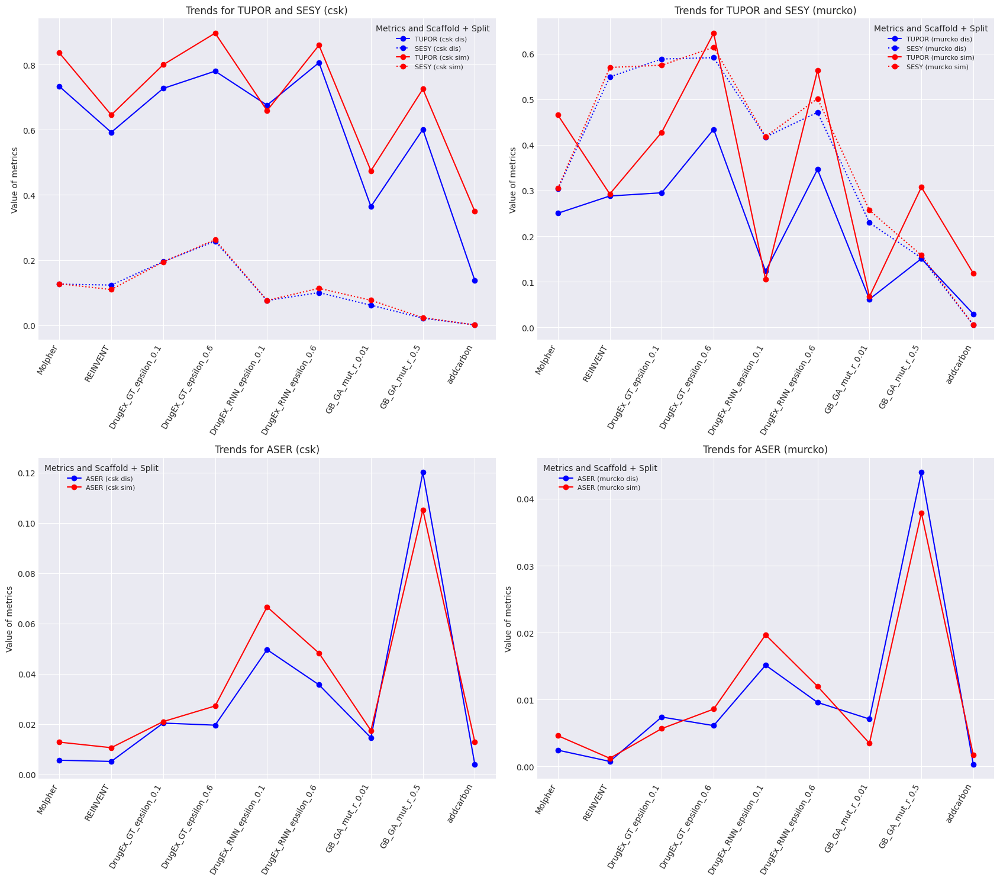

In [295]:
receptor = 'Leukocyte_elastase'

if receptor == 'Glucocorticoid_receptor':
    name_save = f'trens_plot_GR_only_base'
elif receptor == 'Leukocyte_elastase':
    name_save = f'trens_plot_LE_only_base'
    
generators_name_list = [
                f"Molpher{subset}",
                f"REINVENT{subset}",
                f"DrugEx_GT_epsilon_0.1{subset}",
                f"DrugEx_GT_epsilon_0.6{subset}",
                f"DrugEx_RNN_epsilon_0.1{subset}",
                f"DrugEx_RNN_epsilon_0.6{subset}",
                f"GB_GA_mut_r_0.01{subset}",
                f"GB_GA_mut_r_0.5{subset}",
                f"addcarbon{subset}"
            ]
df_all = pd.DataFrame()
for type_scaffold in ['csk', 'murcko']:
    for type_cluster in ['dis', 'sim']:
            # Load the data for the given scaffold and split type
            df = tr.preprocesing(type_cluster, type_scaffold, generators_name_list, receptor)
            df = df[['name', 'TUPOR', 'SESY', 'ASER']]
            df['Scaffold'] = type_scaffold  # Add a column for the scaffold type
            df['Type_Split'] = type_cluster  # Add a column for the split type (DIS/SIM)
            df_all = pd.concat([df_all, df], ignore_index=True)

    
tr.plot_trends_base(scaffolds=['csk', 'murcko'], type_cluster=['dis', 'sim'], df_all=df_all, receptor=receptor, name_save=name_save)

# t-SNE

In [2]:
from scripts import t_sne_plot as tsne
import importlib as imp
imp.reload(tsne)


<module 'scripts.t_sne_plot' from '/home/filv/phd_projects/iga_2023/git_reccal/new/recall_metrics/scripts/t_sne_plot.py'>

In [ ]:
for receptor in ['Glucocorticoid_receptor']:
    for type_cluster in ['dis']:
        for number in [0]:
        
            data_for_tsne = [
                f'input_recall_sets/{receptor}/cIS_{receptor}_{type_cluster}_{number}.csv', 
                f'input_recall_sets/{receptor}/cRS_{receptor}_{type_cluster}_{number}.csv'
                ]
            for gen in ['Molpher', 'REINVENT', 'addcarbon', 'DrugEx_GT_epsilon_0.1', 'DrugEx_GT_epsilon_0.6',\
                    'DrugEx_RNN_epsilon_0.1', 'DrugEx_RNN_epsilon_0.6', 'GB_GA_mut_r_0.01', 'GB_GA_mut_r_0.5']:
                gen_path = f'output_sets/{receptor}/{gen}/cOS_{gen}_{type_cluster}_{number}_one_column.csv'
                data_for_tsne.append(gen_path)

            print(data_for_tsne)
            
            labels_dict = {
                0: 'IS',
                1: 'RS',
                2: 'Molpher',
                3: 'REINVENT',
                4: 'addcarbon',
                5: 'DrugEx_GT_e_0.1',
                6: 'DrugEx_GT_e_0.6',
                7: 'DrugEx_RNN_e_0.1',
                8: 'DrugEx_RNN_e_0.6',
                9: 'GB_GA_mut_r_0.01',
                10: 'GB_GA_mut_r_0.5'
                }

            tsne.process_for_plot_tsne(data_for_tsne, type_cluster, number, receptor, labels_dict)


['input_recall_sets/Glucocorticoid_receptor/cIS_Glucocorticoid_receptor_dis_0.csv', 'input_recall_sets/Glucocorticoid_receptor/cRS_Glucocorticoid_receptor_dis_0.csv', 'output_sets/Glucocorticoid_receptor/Molpher/cOS_Molpher_dis_0_one_column.csv', 'output_sets/Glucocorticoid_receptor/REINVENT/cOS_REINVENT_dis_0_one_column.csv', 'output_sets/Glucocorticoid_receptor/addcarbon/cOS_addcarbon_dis_0_one_column.csv', 'output_sets/Glucocorticoid_receptor/DrugEx_GT_epsilon_0.1/cOS_DrugEx_GT_epsilon_0.1_dis_0_one_column.csv', 'output_sets/Glucocorticoid_receptor/DrugEx_GT_epsilon_0.6/cOS_DrugEx_GT_epsilon_0.6_dis_0_one_column.csv', 'output_sets/Glucocorticoid_receptor/DrugEx_RNN_epsilon_0.1/cOS_DrugEx_RNN_epsilon_0.1_dis_0_one_column.csv', 'output_sets/Glucocorticoid_receptor/DrugEx_RNN_epsilon_0.6/cOS_DrugEx_RNN_epsilon_0.6_dis_0_one_column.csv', 'output_sets/Glucocorticoid_receptor/GB_GA_mut_r_0.01/cOS_GB_GA_mut_r_0.01_dis_0_one_column.csv', 'output_sets/Glucocorticoid_receptor/GB_GA_mut_r_0.5/

In [ ]:
for type_cluster in ['dis']:
    for number in [0,1,2,3,4]:
        tsne.plot_tsne_results(type_cluster, number)


# NEXT

In [126]:
df = pd.read_csv("data/results/Glucocorticoid_receptor/csk_scaffolds/dis/mean_csk_dis_norm_min_max.csv")
df

,name,type_cluster,scaffold,USo,SSo,TUPOR,SESY,ASER,ACR,CwASo
0,Molpher_mean,dis,csk,0.371868,0.130167,0.747826,0.421685,0.169556,0.082417,0.087635
1,REINVENT_mean,dis,csk,0.366441,0.110692,0.673248,0.398944,0.155714,0.060045,0.149951
2,DrugEx_GT_epsilon_0.1_mean,dis,csk,0.523148,0.057305,0.792366,0.585498,0.189511,0.035135,0.161398
3,DrugEx_GT_epsilon_0.6_mean,dis,csk,1.000000,0.542775,1.000000,1.000000,0.373230,0.000000,0.386815
4,DrugEx_RNN_epsilon_0.1_mean,dis,csk,0.266665,0.000000,0.547725,0.304843,0.199902,0.077189,0.152578
5,DrugEx_RNN_epsilon_0.6_mean,dis,csk,0.323263,0.461688,0.907958,0.329210,1.000000,0.121012,1.000000
6,GB_GA_mut_r_0.01_mean,dis,csk,0.579494,0.999762,0.732804,0.525962,0.080205,0.018759,0.094376
7,GB_GA_mut_r_0.5_mean,dis,csk,0.423770,0.999855,0.640661,0.384617,0.150534,0.042362,0.177262
8,addcarbon_mean,dis,csk,0.000000,1.000000,0.000000,0.000000,0.000000,1.000000,0.000000


In [131]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd

# Vytvoření vzorových dat
generators = ['Molpher', 'REINVENT', 'DrugEx_GT_epsilon_0.1', 'DrugEx_GT_epsilon_0.6', 'DrugEx_RNN_epsilon_0.1', 'DrugEx_RNN_epsilon_0.6', 'GB_GA_mut_r_0.01', 'GB_GA_mut_r_0.5', 'addcarbon']
receptors = ['Glucocorticoid_receptor', 'Leukocyte_elastase']
scaffolds = ['csk', 'murcko']
splits = ['dis', 'sim']
metrics = ['TUPOR', 'SESY', 'ASER', 'ACR']

# Představme si, že hodnoty jsou náhodně generované pro ilustraci
data = []
for gen in generators:
    for receptor in receptors:
        for scaffold in scaffolds:
            for split in splits:
                df = pd.read_csv(f'data/results/{receptor}/{scaffold}_scaffolds/{split}/mean_{scaffold}_{split}_norm_min_max.csv')
                for met in metrics:
                    # Generování náhodných hodnot pro ilustraci
                    value = df[df.name.str.startswith(gen)][met].iloc[0]
                    data.append([gen, receptor, scaffold, split, met, value])

# Vytvoření DataFrame
df = pd.DataFrame(data, columns=['Generator', 'Receptor', 'Scaffold', 'Split', 'Metric', 'Value'])
df

,Generator,Receptor,Scaffold,Split,Metric,Value
0,Molpher,Glucocorticoid_receptor,csk,dis,TUPOR,0.747826
1,Molpher,Glucocorticoid_receptor,csk,dis,SESY,0.421685
2,Molpher,Glucocorticoid_receptor,csk,dis,ASER,0.169556
3,Molpher,Glucocorticoid_receptor,csk,dis,ACR,0.082417
4,Molpher,Glucocorticoid_receptor,csk,sim,TUPOR,0.745130
...,...,...,...,...,...,...
283,addcarbon,Leukocyte_elastase,murcko,dis,ACR,1.000000
284,addcarbon,Leukocyte_elastase,murcko,sim,TUPOR,0.088097
285,addcarbon,Leukocyte_elastase,murcko,sim,SESY,0.000000
286,addcarbon,Leukocyte_elastase,murcko,sim,ASER,0.012919


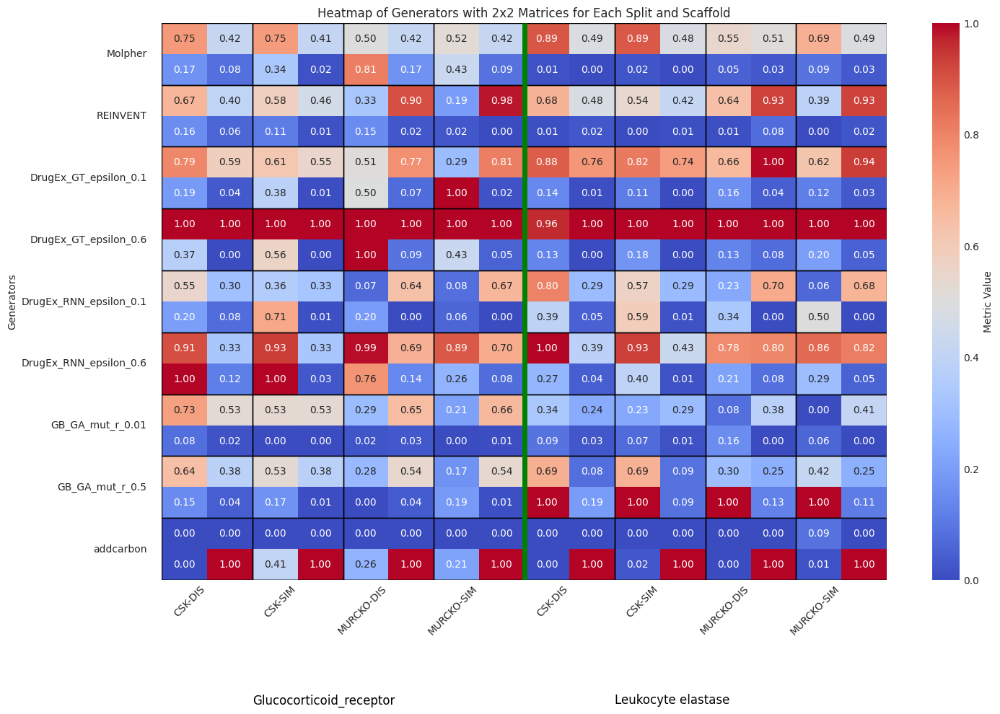

In [146]:


# Předpříprava dat pro heatmapu
heatmap_data = []

# Pro každý generator
for generator in df.Generator.unique():
    df_sub = df[df.Generator == generator]  # Podmnožina pro aktuální generator
    matrix_1 = []
    matrix_2 = []
    
    # Pro každý receptor
    for receptor in df_sub.Receptor.unique():
        df_sub_r = df_sub[df_sub.Receptor == receptor]  # Podmnožina pro aktuální receptor

        # Pro každý scaffold
        for scaffold in df_sub_r.Scaffold.unique():
            df_sub_r_s = df_sub_r[df_sub_r.Scaffold == scaffold]  # Podmnožina pro aktuální scaffold

            # Vytvoření 2x2 matic pro každý split
            for split in splits:
                df_sub_r_s_s = df_sub_r_s[df_sub_r_s.Split == split]

                # Pro každý split vezmeme hodnoty pro 4 metriky
                metric1_value = df_sub_r_s_s[df_sub_r_s_s.Metric == 'TUPOR']['Value'].values[0]
                metric2_value = df_sub_r_s_s[df_sub_r_s_s.Metric == 'SESY']['Value'].values[0]
                metric3_value = df_sub_r_s_s[df_sub_r_s_s.Metric == 'ASER']['Value'].values[0]
                metric4_value = df_sub_r_s_s[df_sub_r_s_s.Metric == 'ACR']['Value'].values[0]

                # Přidání hodnot do 2x2 matice
                matrix_1.append(metric1_value)
                matrix_1.append(metric2_value)
                matrix_2.append(metric3_value)
                matrix_2.append(metric4_value)

    heatmap_data.append(matrix_1)
    heatmap_data.append(matrix_2)
    

# Převedení heatmap_data na numpy array pro snazší vykreslení
heatmap_data = np.array(heatmap_data)

# Vytvoření figure pro heatmapu
fig, ax = plt.subplots(figsize=(12, 10))

# Vykreslení heatmapy
sns.heatmap(heatmap_data, annot=True,fmt=".2f", cmap='coolwarm', ax=ax,
            cbar_kws={'label': 'Metric Value'})

# Titulky a popisky
ax.set_title('Heatmap of Generators with 2x2 Matrices for Each Split and Scaffold')
ax.set_ylabel('Generators')

ytick_positions = np.arange(0, len(generators) * 2, 2) + 1  # Posunutí do středu každé dvojice řádků
ax.set_yticks(ytick_positions)  
ax.set_yticklabels(generators, rotation=0, ha="right")  # Zarovnání na střed

# Zvýšení mezer mezi tick-labels
ax.tick_params(axis='y', pad=15)  # Hodnotu můžeš upravit podle potřeby

# Přidání rámečků kolem 2x2 matic
for i in range(len(heatmap_data)):
    for k in [0,2,4,6,8,10,12,14]:
        ax.add_patch(plt.Rectangle((k, i * 2), 2, 2, fill=False, edgecolor='black', lw=1))  # Rámeček pro první 2x2


ax.vlines(x=8, ymin=0, ymax=len(generators) * 2, colors='green', linewidth=5)

custom_xticklabels = ["CSK-DIS", "", "CSK-SIM", "", "MURCKO-DIS", "", "MURCKO-SIM", "", "CSK-DIS", "", "CSK-SIM", "", "MURCKO-DIS", "", "MURCKO-SIM", ""]

# Nastavení popisků osy X
ax.set_xticks(np.arange(len(custom_xticklabels)) + 1)  # Posun na střed sloupců
ax.set_xticklabels(custom_xticklabels, rotation=45, ha="right", fontsize=10)  # Rotace a zarovnání

ax.text(2, 22, "Glucocorticoid_receptor", fontsize=12, color='black')
ax.text(10, 22, "Leukocyte elastase", fontsize=12, color='black')
# Zobrazení heatmapy
plt.tight_layout()
plt.savefig(f'img/heat_mapa/all_res_norm.svg', format="svg")
plt.show()


In [143]:
def custom_sigmoid_transform(value, k=10):
    """Aplikuje sigmoidní transformaci a zaokrouhlí na 0, 0.5 nebo 1."""

    # Rozhodování podle nejbližší hodnoty
    if value < 0.25:
        return 0
    elif value >= 0.75:
        return 1
    else:
        return 0.5

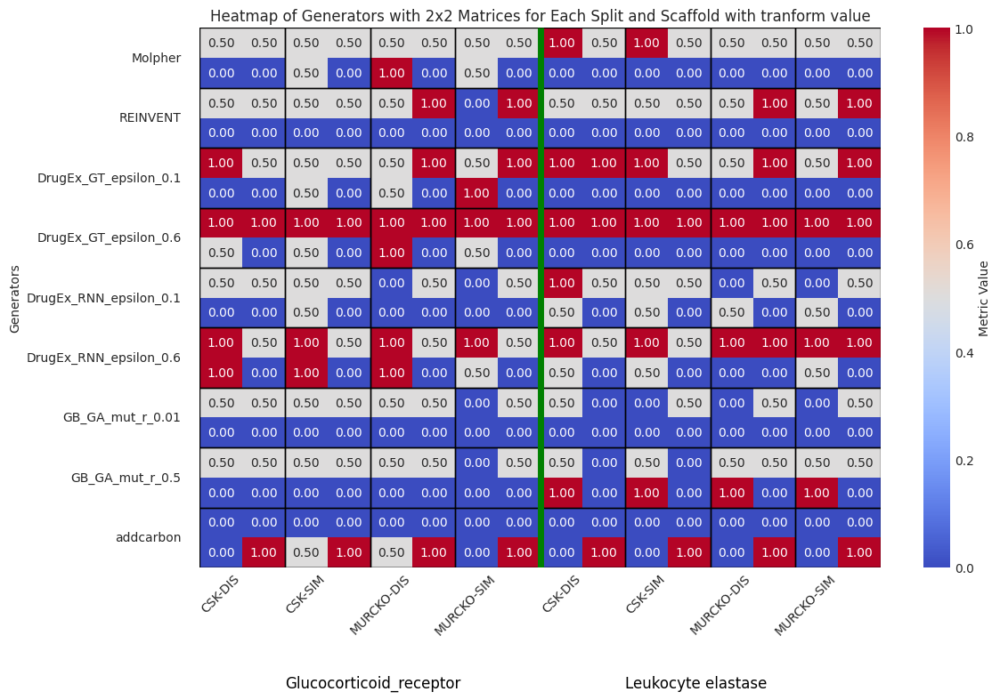

In [148]:


# Předpříprava dat pro heatmapu
heatmap_data = []

# Pro každý generator
for generator in df.Generator.unique():
    df_sub = df[df.Generator == generator]  # Podmnožina pro aktuální generator
    matrix_1 = []
    matrix_2 = []
    
    # Pro každý receptor
    for receptor in df_sub.Receptor.unique():
        df_sub_r = df_sub[df_sub.Receptor == receptor]  # Podmnožina pro aktuální receptor

        # Pro každý scaffold
        for scaffold in df_sub_r.Scaffold.unique():
            df_sub_r_s = df_sub_r[df_sub_r.Scaffold == scaffold]  # Podmnožina pro aktuální scaffold

            # Vytvoření 2x2 matic pro každý split
            for split in splits:
                df_sub_r_s_s = df_sub_r_s[df_sub_r_s.Split == split]

                # Pro každý split vezmeme hodnoty pro 4 metriky
                metric1_value = df_sub_r_s_s[df_sub_r_s_s.Metric == 'TUPOR']['Value'].values[0]
                metric2_value = df_sub_r_s_s[df_sub_r_s_s.Metric == 'SESY']['Value'].values[0]
                metric3_value = df_sub_r_s_s[df_sub_r_s_s.Metric == 'ASER']['Value'].values[0]
                metric4_value = df_sub_r_s_s[df_sub_r_s_s.Metric == 'ACR']['Value'].values[0]

                # Přidání hodnot do 2x2 matice
                matrix_1.append(metric1_value)
                matrix_1.append(metric2_value)
                matrix_2.append(metric3_value)
                matrix_2.append(metric4_value)

    heatmap_data.append(matrix_1)
    heatmap_data.append(matrix_2)
    

# Převedení heatmap_data na numpy array pro snazší vykreslení
heatmap_data = np.array(heatmap_data)
heatmap_data = np.vectorize(custom_sigmoid_transform)(heatmap_data)

# Vytvoření figure pro heatmapu
fig, ax = plt.subplots(figsize=(12, 8))

# Vykreslení heatmapy
sns.heatmap(heatmap_data, annot=True,fmt=".2f", cmap='coolwarm', ax=ax,
            cbar_kws={'label': 'Metric Value'})

# Titulky a popisky
ax.set_title('Heatmap of Generators with 2x2 Matrices for Each Split and Scaffold with tranform value')
ax.set_ylabel('Generators')

ytick_positions = np.arange(0, len(generators) * 2, 2) + 1  # Posunutí do středu každé dvojice řádků
ax.set_yticks(ytick_positions)  
ax.set_yticklabels(generators, rotation=0, ha="right")  # Zarovnání na střed

# Zvýšení mezer mezi tick-labels
ax.tick_params(axis='y', pad=15)  # Hodnotu můžeš upravit podle potřeby

# Přidání rámečků kolem 2x2 matic
for i in range(len(heatmap_data)):
    for k in [0,2,4,6,8,10,12,14]:
        ax.add_patch(plt.Rectangle((k, i * 2), 2, 2, fill=False, edgecolor='black', lw=1))  # Rámeček pro první 2x2


ax.vlines(x=8, ymin=0, ymax=len(generators) * 2, colors='green', linewidth=5)

custom_xticklabels = ["CSK-DIS", "", "CSK-SIM", "", "MURCKO-DIS", "", "MURCKO-SIM", "", "CSK-DIS", "", "CSK-SIM", "", "MURCKO-DIS", "", "MURCKO-SIM", ""]

# Nastavení popisků osy X
ax.set_xticks(np.arange(len(custom_xticklabels)) + 1)  # Posun na střed sloupců
ax.set_xticklabels(custom_xticklabels, rotation=45, ha="right", fontsize=10)  # Rotace a zarovnání

ax.text(2, 22, "Glucocorticoid_receptor", fontsize=12, color='black')
ax.text(10, 22, "Leukocyte elastase", fontsize=12, color='black')
# Zobrazení heatmapy
plt.tight_layout()
plt.savefig(f'img/heat_mapa/all_res_trans.svg', format="svg")
plt.show()


# UMAP

In [1]:
from src import umap_plot as um
import importlib as imp
imp.reload(um)

import pandas as pd

/home/filv/.conda/envs/recall_metrics_env/lib/python3.9/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [ ]:
for receptor in ['Glucocorticoid_receptor']:
    for type_cluster in ['dis']:
        for number in [0]:
        
            data = [
                f'input_recall_sets/{receptor}/cIS_{receptor}_{type_cluster}_{number}.csv', 
                f'input_recall_sets/{receptor}/cRS_{receptor}_{type_cluster}_{number}.csv'
                ]
            for gen in ['Molpher', 'REINVENT', 'addcarbon', 'DrugEx_GT_epsilon_0.1', 'DrugEx_GT_epsilon_0.6',\
                    'DrugEx_RNN_epsilon_0.1', 'DrugEx_RNN_epsilon_0.6', 'GB_GA_mut_r_0.01', 'GB_GA_mut_r_0.5']:
                gen_path = f'output_sets/{receptor}/{gen}/cOS_{gen}_{type_cluster}_{number}_one_column.csv'
                data.append(gen_path)

            
            labels_dict = {
                0: 'IS',
                1: 'RS',
                2: 'Molpher',
                3: 'REINVENT',
                4: 'addcarbon',
                5: 'DrugEx_GT_e_0.1',
                6: 'DrugEx_GT_e_0.6',
                7: 'DrugEx_RNN_e_0.1',
                8: 'DrugEx_RNN_e_0.6',
                9: 'GB_GA_mut_r_0.01',
                10: 'GB_GA_mut_r_0.5'
                }

            um_class = um.Umap_class(data, type_cluster, number, receptor, labels_dict)
            um_class.process_for_plot_umap()

Processing dataset 0...
Creating fingerprints...


[11:17:29] Can't kekulize mol.  Unkekulized atoms: 30 32 33 34 41 42 44
[11:17:29] Can't kekulize mol.  Unkekulized atoms: 5 6 7 8 9 10 11 13 16 20 21 22
[11:17:29] Can't kekulize mol.  Unkekulized atoms: 30 31 32 34 35 36 37 38 40
[11:17:29] Can't kekulize mol.  Unkekulized atoms: 5 6 7 8 10 11 13
[11:17:29] Can't kekulize mol.  Unkekulized atoms: 5 7 8 10 11 12
[11:17:30] Can't kekulize mol.  Unkekulized atoms: 28 29 30 31 32 33 38 39 40
[11:17:30] SMILES Parse Error: unclosed ring for input: 'S(=O)(c2ccccc1)cc2C(Oc1ccc2c(cnn2-c2ccncc2)c1)C(C)CC'
[11:17:31] SMILES Parse Error: ring closure 3 duplicates bond between atom 38 and atom 39 for input: 'CC(NC(=O)Cc1csc(C)n1)C(Oc1ccc2c(cnn2-c2ccc(F)cc2F)c1)c1ccc(N2CCC3(C3)CC2)nc1'
[11:17:31] Can't kekulize mol.  Unkekulized atoms: 27 29 30 31 32 33
[11:17:31] Can't kekulize mol.  Unkekulized atoms: 28 29 30 31 34 35 45 46 47
[11:17:31] Can't kekulize mol.  Unkekulized atoms: 30 32 33 34 35 36
[11:17:32] Can't kekulize mol.  Unkekulized atoms

Finished creating fingerprints
Calculating distance matrix...


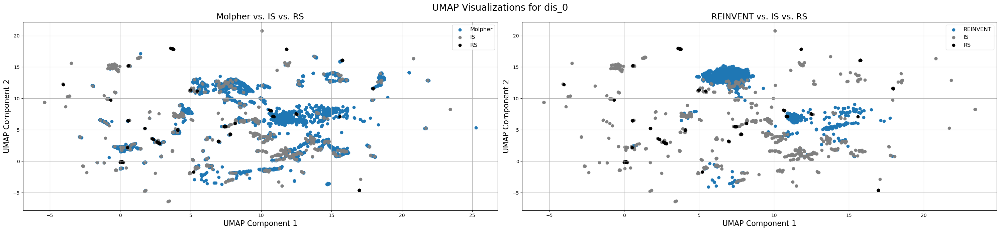

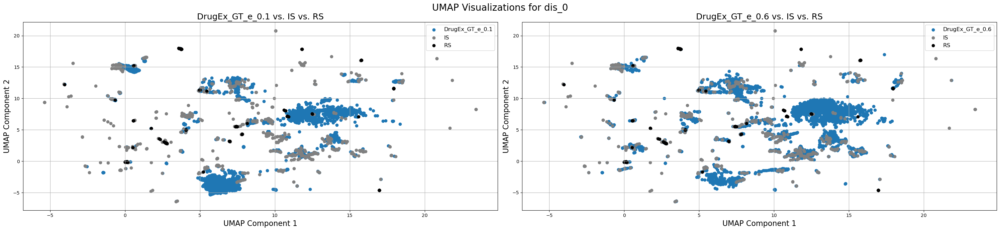

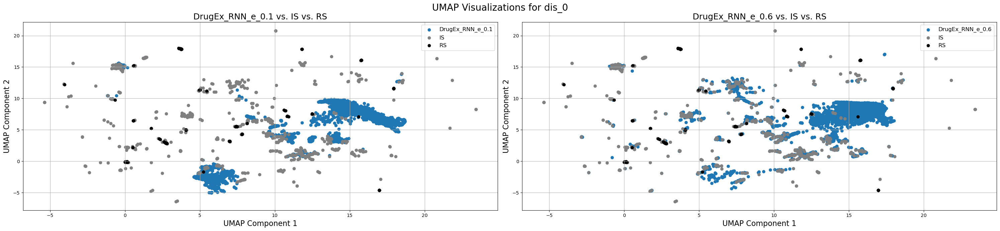

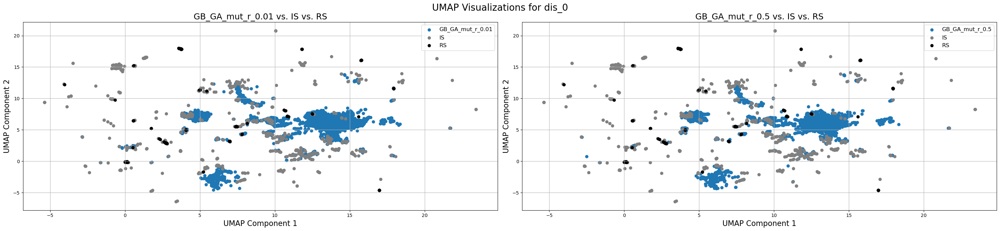

In [15]:
import itertools

for type_cluster in ['dis']:
    for number in [0]:
        receptor = 'Glucocorticoid_receptor'
            # Define unique label categories for plotting
        '''
        unique_labels = [
        ['Molpher', 'IS', 'RS'],
        ['REINVENT', 'IS', 'RS'],
        ['addcarbon', 'IS', 'RS'],
        ['DrugEx_GT_e_0.1', 'IS', 'RS'],
        ['DrugEx_GT_e_0.6', 'IS', 'RS'],
        ['DrugEx_RNN_e_0.1', 'IS', 'RS'],
        ['DrugEx_RNN_e_0.6', 'IS', 'RS'],
        ['GB_GA_mut_r_0.01', 'IS', 'RS'],
        ['GB_GA_mut_r_0.5', 'IS', 'RS'],
            
        ]'''
        
        generators = ['Molpher', 'REINVENT', 'DrugEx_GT_e_0.1', 'DrugEx_GT_e_0.6',
              'DrugEx_RNN_e_0.1', 'DrugEx_RNN_e_0.6', 'GB_GA_mut_r_0.01', 'GB_GA_mut_r_0.5']

        # Procházení všech možných dvojic
        for gen1, gen2 in zip(generators[::2], generators[1::2]):
            unique_labels = [
                [gen1, 'IS', 'RS'],
                [gen2, 'IS', 'RS']]
            
            name_save = f'umap_all_{type_cluster}_{number}_{gen1}_{gen2}'
            um.plot_umap_results(type_cluster, number, receptor, unique_labels, name_save)


# Overlaps plots

In [ ]:
from src import overlaps as ov
import importlib as imp
imp.reload(ov)

import pandas as pd

In [ ]:
receptor = 'Glucocorticoid_receptor'
generator_list = ['Molpher', 'REINVENT', 'DrugEx_GT_epsilon_0.1','DrugEx_GT_epsilon_0.6', 'DrugEx_RNN_epsilon_0.1','DrugEx_RNN_epsilon_0.6']
num_graphs = 5 # The number of how much combinations you want to see, if you want to see all of them please put very high number like 10000

ov.plot_overlaps(receptor, generator_list, num_graphs)
